In [1]:
#!pip3 install ultralytics
# Uncomment below lines to grab data from colab
#from google.colab import drive
#drive.mount('/content/gdrive/', force_remount=True)
#%cd gdrive/MyDrive/Computer_Vision

#notebooks_path = '/content/gdrive/MyDrive/Colab Notebooks/'
#current_directory = '/content/drive/MyDrive/Computer_Vision/agri_data/data'
#!unzip


import os
import re
import sys

import tqdm
from PIL import Image

import argparse
from concurrent import futures

current_dir= '/Users/roshantiwari/src/Robot-Computer-Vision'
dataset_dir = f'{current_dir}/agri_data/data'


In [2]:
def view_image_and_label(current_directory, filename, show_label = True):

  if '.' in str(filename):
    name = str(filename).split('.')[0]
  else:
    name = str(filename)

  # open method used to open different extension image file
  im = Image.open(f'{current_directory}/{name}.jpeg')

  # This method will show image in any image viewer
  im.show()

  if show_label == True:
    #This will print the label for the image
    with open(f'{current_directory}/{name}.txt') as f:
        print(f.readlines())


In [3]:
#view_image_and_label(dataset_dir, 'agri_0_1512')

In [4]:
def list_images_by_class(current_directory, label = 0):

  #The weed vs crop dataset has two classes 0 - plants, 1- weed.
  if label not in  [0, 1]:
    print('Invalid class')
    return []

  all_files = os.listdir(current_directory)
  all_names = set()

  for i in all_files:
    all_names.add(i.split('.')[0])

  required_files = []
  for i in all_names:
    with open(f'{current_directory}/{i}.txt') as fp:
      lines = fp.readlines()

    if int(lines[0][0]) == label:
      required_files.append(i)

  if label == 0:
    print('Returning names of all plants. And here is a sample of 5 images')
  else:
    print('Returning names of all plants. And here is a sample of 5 images')

  for i in required_files[:4]:
      view_image_and_label(current_directory, i)

  return required_files

In [5]:
#filenames = list_images_by_class(dataset_dir, 0)

In [6]:
from ultralytics import YOLO

from IPython.display import display, Image

In [7]:
model = YOLO("yolov8n-cls.pt")  # load a pretained model

In [8]:
#Create dataset in the following format Root directory -- Train and Eval folders -- Inside train and eval plant and weed folders

import random
import shutil

def create_dataset(root_directory, current_directory, train_ratio):

  #In the unzipped files there are two files with every name one is jpeg other is txt
  all_files = os.listdir(current_directory)
  all_names = set()

  for i in all_files:
    all_names.add(i.split('.')[0])

  plants = []
  weeds = []
  for i in all_names:
    with open(f'{current_directory}/{i}.txt') as fp:
      lines = fp.readlines()

    if int(lines[0][0]) == 0:
      plants.append(i)
    else:
      weeds.append(i)

  if not os.path.exists(root_directory):
    os.mkdir(root_directory)

  if not os.path.exists(f'{root_directory}/train'):
    os.mkdir(f'{root_directory}/train')

  if not os.path.exists(f'{root_directory}/val'):
    os.mkdir(f'{root_directory}/val')

  if not os.path.exists(f'{root_directory}/train/weeds'):
    os.mkdir(f'{root_directory}/train/weeds')

  if not os.path.exists(f'{root_directory}/train/plants'):
    os.mkdir(f'{root_directory}/train/plants')

  if not os.path.exists(f'{root_directory}/val/plants'):
    os.mkdir(f'{root_directory}/val/plants')

  if not os.path.exists(f'{root_directory}/val/weeds'):
    os.mkdir(f'{root_directory}/val/weeds')

  num_train_plants = int(len(plants)*train_ratio)

  num_train_weeds = int(len(weeds)*train_ratio)

  plant_train_images = random.sample(plants, num_train_plants)
  plant_val_images = []

  for name in plants:
    if name not in plant_train_images:
      plant_val_images.append(name)

  weed_train_images = random.sample(weeds, num_train_weeds)
  weed_val_images = []

  for name in weeds:
    if name not in weed_train_images:
      weed_val_images.append(name)

  for name in plant_train_images:
    shutil.copy(f'{current_directory}/{name}.jpeg', f'{root_directory}/train/plants/{name}.jpeg')

  for name in weed_train_images:
    shutil.copy(f'{current_directory}/{name}.jpeg', f'{root_directory}/train/weeds/{name}.jpeg')

  for name in plant_val_images:
    shutil.copy(f'{current_directory}/{name}.jpeg', f'{root_directory}/val/plants/{name}.jpeg')

  for name in weed_val_images:
    shutil.copy(f'{current_directory}/{name}.jpeg', f'{root_directory}/val/weeds/{name}.jpeg')

In [9]:
#Delete Dataset Folder
shutil.rmtree('./runs')

In [10]:
#root_directory = '/content/drive/MyDrive/Computer_Vision/weed_vs_crop_dataset'
root_dir = f'{current_dir}/dataset_split'
create_dataset(root_dir, dataset_dir, 0.8)

In [11]:
trained_model = model.train(data=root_dir, epochs=20, imgsz=64)

Ultralytics 8.3.47 🚀 Python-3.11.11 torch-2.5.1 CPU (Apple M4)
engine/trainer: task=classify, mode=train, model=yolov8n-cls.pt, data=/Users/roshantiwari/src/Robot-Computer-Vision/dataset_split, epochs=20, time=None, patience=100, batch=16, imgsz=64, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

train: Scanning /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/train... 1039 images, 0 corrupt: 100%|██████████| 1039/1039 [00:00<00:00, 5117.05it/s]

train: New cache created: /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/train.cache



val: Scanning /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/val... 261 images, 0 corrupt: 100%|██████████| 261/261 [00:00<00:00, 8522.42it/s]

val: New cache created: /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/val.cache
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
Image sizes 64 train, 64 val
Using 0 dataloader workers
Logging results to runs/classify/train
Starting training for 20 epochs...

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.85it/s]

                   all      0.816          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.46it/s]

                   all       0.92          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.58it/s]

                   all      0.943          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.19it/s]

                   all       0.95          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.49it/s]

                   all      0.943          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.18it/s]

                   all      0.939          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.30it/s]

                   all      0.958          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.59it/s]

                   all      0.962          1

      Epoch    GPU_mem       loss  Instances       Size



               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.58it/s]

                   all      0.962          1

      Epoch    GPU_mem       loss  Instances       Size



      10/20         0G     0.1654         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.02it/s]

                   all      0.962          1

      Epoch    GPU_mem       loss  Instances       Size



      11/20         0G     0.1874         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.50it/s]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      12/20         0G      0.197         15         64: 100%|██████████| 65/65 [00:05<00:00, 12.02it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.69it/s]

                   all      0.962          1

      Epoch    GPU_mem       loss  Instances       Size



      13/20         0G     0.1796         15         64: 100%|██████████| 65/65 [00:05<00:00, 12.00it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.77it/s]

                   all      0.962          1

      Epoch    GPU_mem       loss  Instances       Size



      14/20         0G     0.1814         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.95it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.48it/s]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      15/20         0G     0.1719         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.86it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.41it/s]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      16/20         0G      0.178         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.99it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.62it/s]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      17/20         0G     0.1593         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.64it/s]

                   all      0.966          1

      Epoch    GPU_mem       loss  Instances       Size



      18/20         0G     0.1569         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.93it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.18it/s]

                   all      0.969          1

      Epoch    GPU_mem       loss  Instances       Size



      19/20         0G     0.1734         15         64: 100%|██████████| 65/65 [00:05<00:00, 11.94it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.37it/s]

                   all      0.969          1

      Epoch    GPU_mem       loss  Instances       Size



      20/20         0G     0.1445         15         64: 100%|██████████| 65/65 [00:05<00:00, 12.03it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.34it/s]

                   all      0.969          1



20 epochs completed in 0.036 hours.
Optimizer stripped from runs/classify/train/weights/last.pt, 3.0MB
Optimizer stripped from runs/classify/train/weights/best.pt, 3.0MB

Validating runs/classify/train/weights/best.pt...
Ultralytics 8.3.47 🚀 Python-3.11.11 torch-2.5.1 CPU (Apple M4)
YOLOv8n-cls summary (fused): 73 layers, 1,437,442 parameters, 0 gradients, 3.3 GFLOPs
train: /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/train... found 1039 images in 2 classes ✅ 
val: /Users/roshantiwari/src/Robot-Computer-Vision/dataset_split/val... found 261 images in 2 classes ✅ 
test: None...


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.48it/s]


                   all      0.969          1
Speed: 0.0ms preprocess, 2.0ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train


In [ ]:
import numpy as np

def predict(model, image_path):

  results = model(image_path)  # predict on an image

  names_dict = results[0].names

  probs = results[0].probs.data.tolist()

  print(f'Logits: {names_dict[0]} = {probs[0]}, {names_dict[1]} = {probs[1]}' )
  print('Prediction: ', names_dict[np.argmax(probs)])

In [ ]:
import pandas as pd

#def plot_metrics():
results_df = pd.read_csv(f'./runs/classify/train/results.csv', encoding = 'utf-8')
print(results_df)

                      epoch               train/loss    metrics/accuracy_top1  \
0                         0                  0.14545                  0.85678   
1                         1                  0.08568                  0.92327   
2                         2                  0.07051                  0.94629   
3                         3                  0.05692                  0.95652   
4                         4                  0.04856                  0.96675   
5                         5                  0.04434                  0.94885   
6                         6                  0.04493                  0.96164   
7                         7                  0.04111                  0.95652   
8                         8                  0.03928                  0.95652   
9                         9                  0.03697                  0.96164   
10                       10                  0.03863                  0.95141   
11                       11 

In [ ]:
import os
#Load model
predict_model = YOLO('./runs/classify/train/weights/best.pt')
val_plants = os.listdir(f'{root_directory}/val/plants')
val_weeds = os.listdir(f'{root_directory}/val/weeds')

image_path = f'{root_directory}/val/plants/{val_plants[1]}'

predict(predict_model, image_path)


image 1/1 /content/drive/MyDrive/Computer_Vision/weed_vs_crop_dataset/val/plants/agri_0_4394.jpeg: 64x64 plants 1.00, weeds 0.00, 10.6ms
Speed: 1.6ms preprocess, 10.6ms inference, 0.2ms postprocess per image at shape (1, 3, 64, 64)


Logits: plants = 0.998696506023407, weeds = 0.0013034968869760633
Prediction:  plants


In [ ]:
train_plants = os.listdir(f'{root_directory}/train/plants')
train_weeds = os.listdir(f'{root_directory}/train/weeds')

agri_0_9861.jpeg


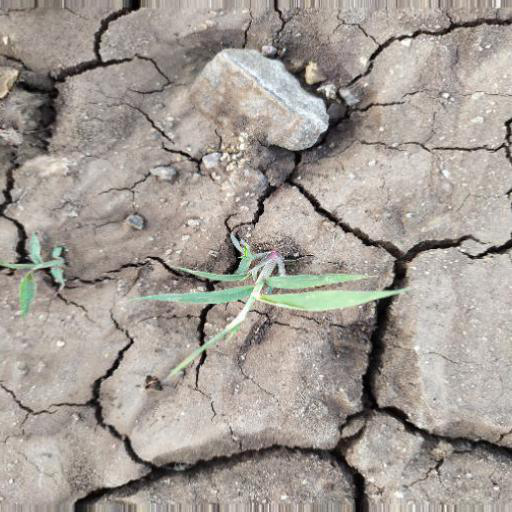

agri_0_9095.jpeg


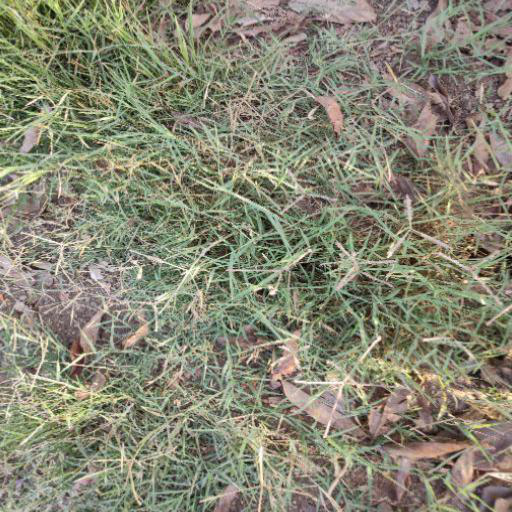

agri_0_5039.jpeg


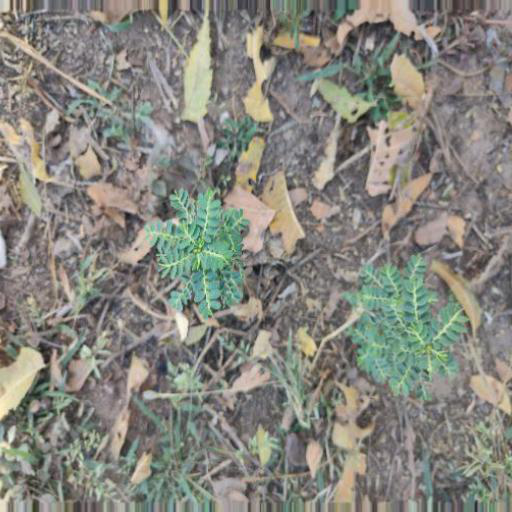

agri_0_7079.jpeg


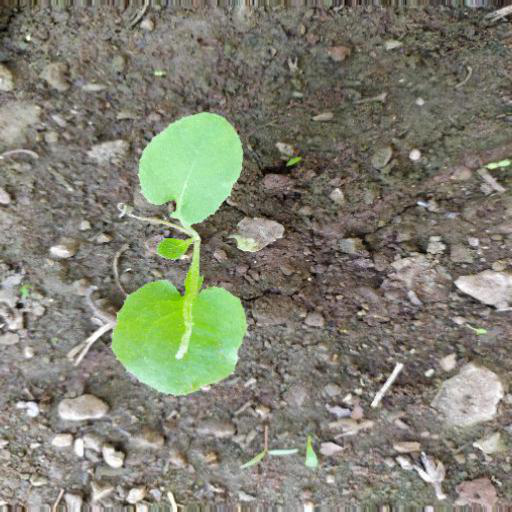

agri_0_7534.jpeg


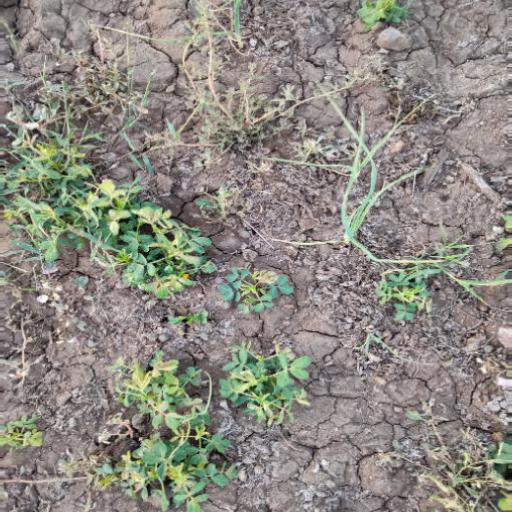

agri_0_6574.jpeg


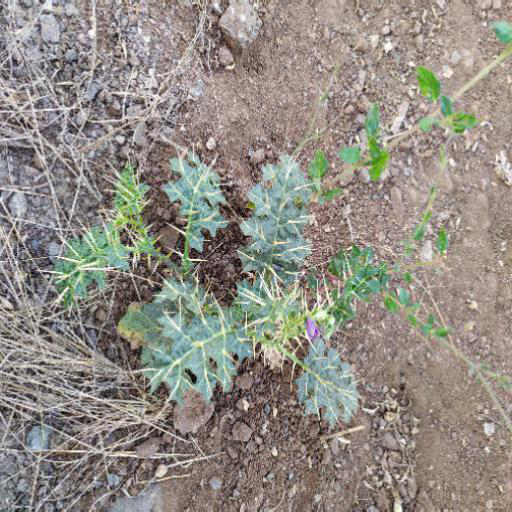

agri_0_2876.jpeg


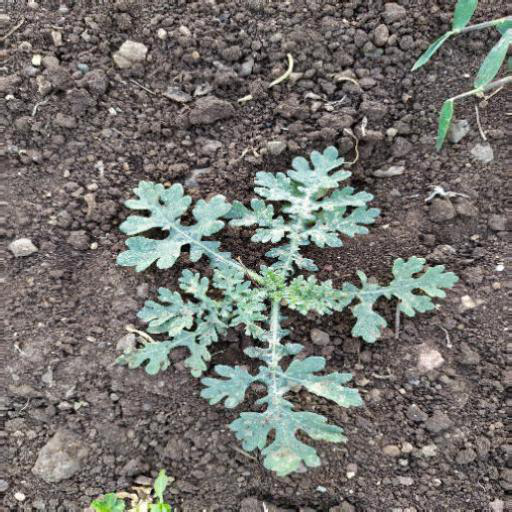

agri_0_6326.jpeg


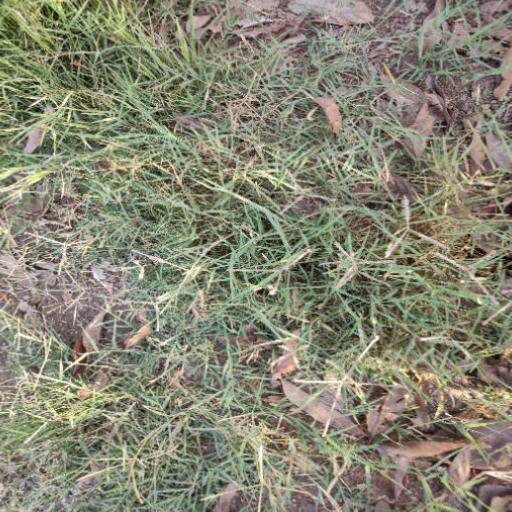

agri_0_3592.jpeg


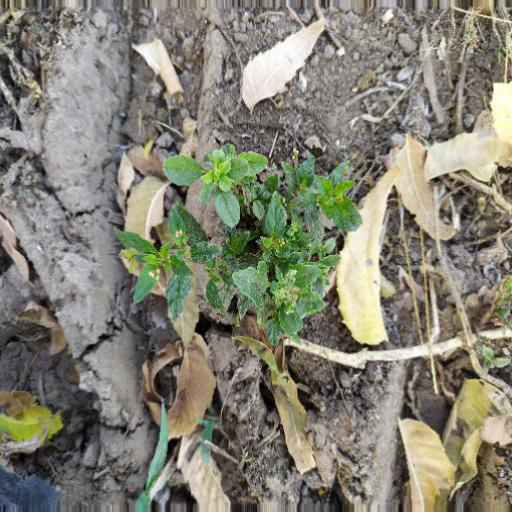

agri_0_1815.jpeg


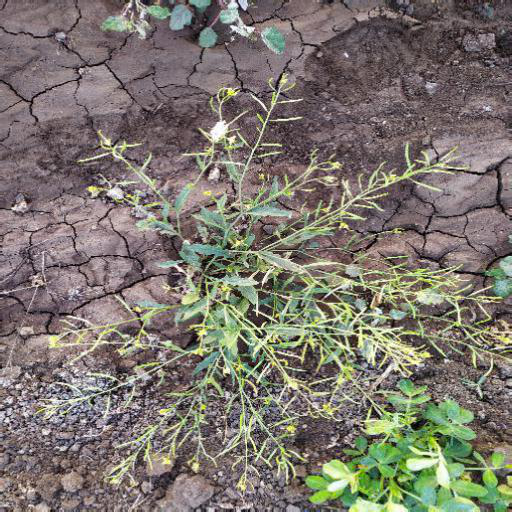

In [ ]:
for name in train_weeds[:10]:
  print(name)
  view_image_and_label(f'{root_directory}/train/weeds', name, show_label = False)

In [ ]:
print(len(train_plants), len(train_weeds))

443 466


In [ ]:
#!zip -r ./runs.zip ./runs
#!unzip ./runs.zip -d ./runs

  adding: runs/ (stored 0%)
  adding: runs/classify/ (stored 0%)
  adding: runs/classify/train/ (stored 0%)
  adding: runs/classify/train/confusion_matrix.png (deflated 36%)
  adding: runs/classify/train/val_batch2_labels.jpg (deflated 1%)
  adding: runs/classify/train/train_batch2.jpg (deflated 1%)
  adding: runs/classify/train/train_batch1.jpg (deflated 1%)
  adding: runs/classify/train/val_batch2_pred.jpg (deflated 1%)
  adding: runs/classify/train/events.out.tfevents.1690130112.615c623aa0fd.968.0 (deflated 71%)
  adding: runs/classify/train/args.yaml (deflated 50%)
  adding: runs/classify/train/val_batch1_labels.jpg (deflated 1%)
  adding: runs/classify/train/val_batch0_labels.jpg (deflated 1%)
  adding: runs/classify/train/train_batch572.jpg (deflated 1%)
  adding: runs/classify/train/train_batch571.jpg (deflated 1%)
  adding: runs/classify/train/confusion_matrix_normalized.png (deflated 35%)
  adding: runs/classify/train/results.png (deflated 10%)
  adding: runs/classify/train/tr

In [ ]:
from google.colab import files
files.download("./runs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

agri_0_7878.jpeg


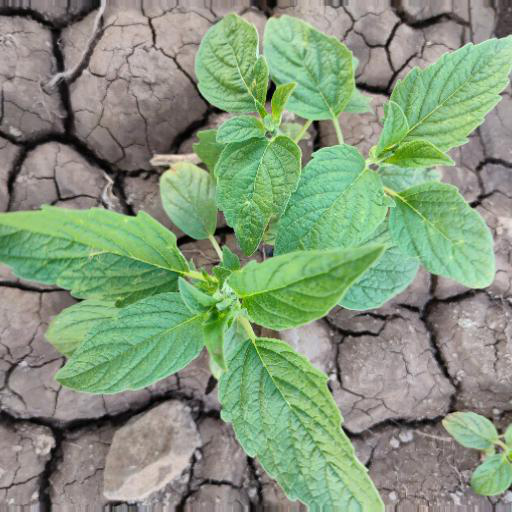

agri_0_9500.jpeg


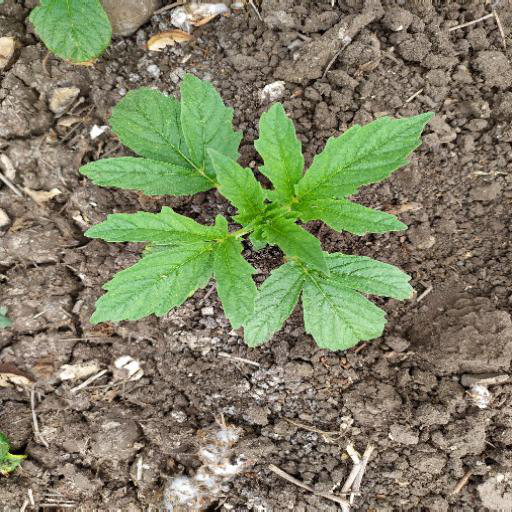

agri_0_787.jpeg


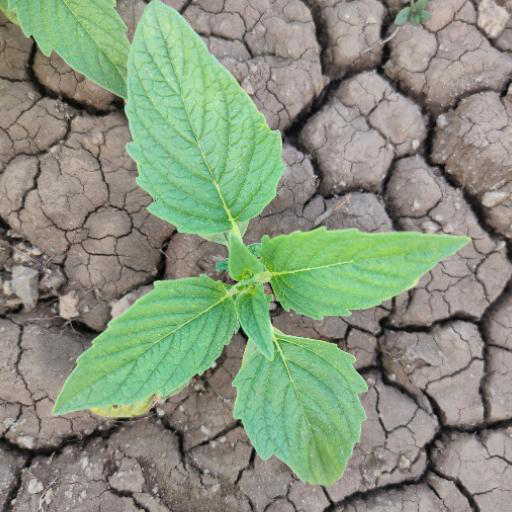

agri_0_8265.jpeg


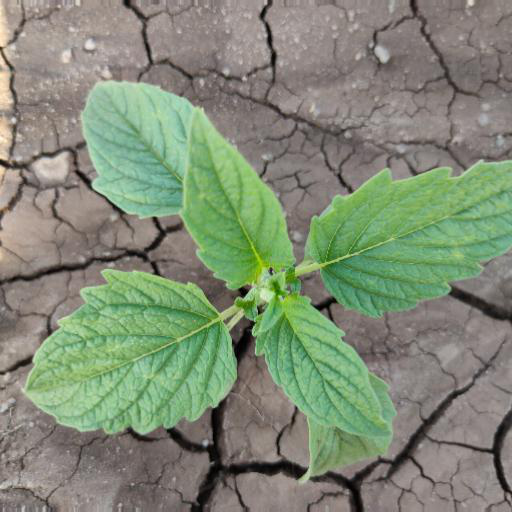

agri_0_6776.jpeg


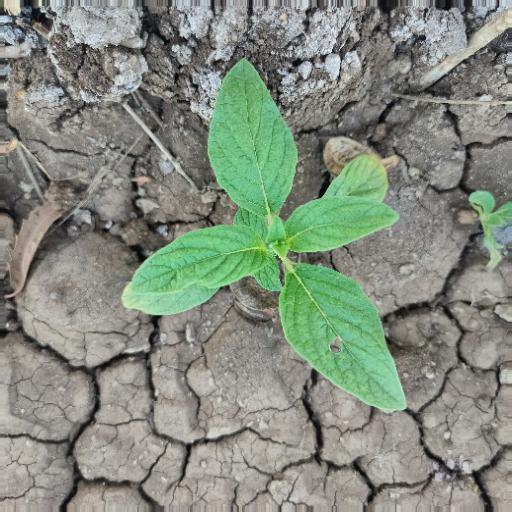

agri_0_8121.jpeg


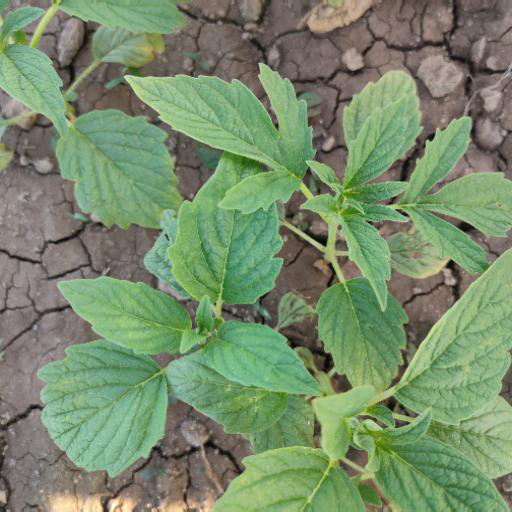

agri_0_7499.jpeg


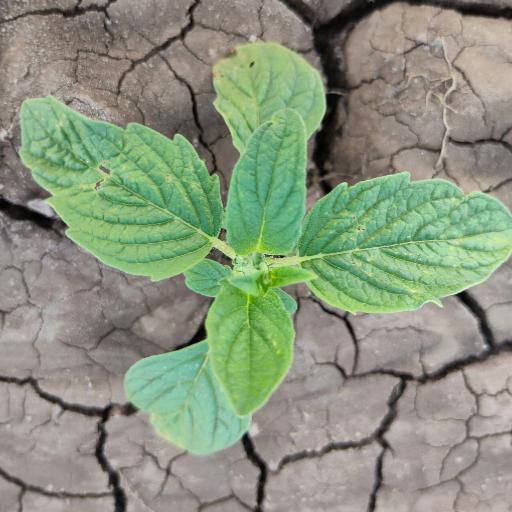

agri_0_6276.jpeg


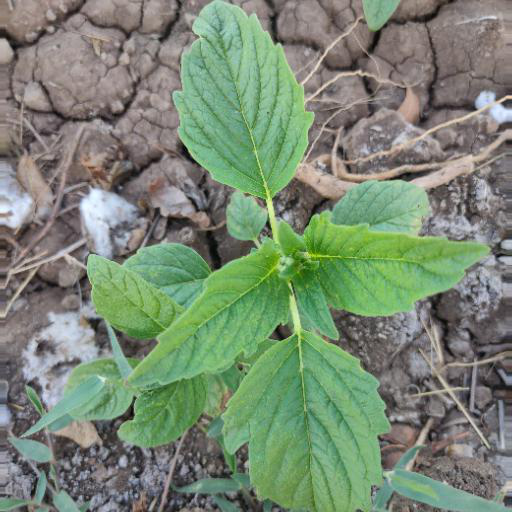

agri_0_1878.jpeg


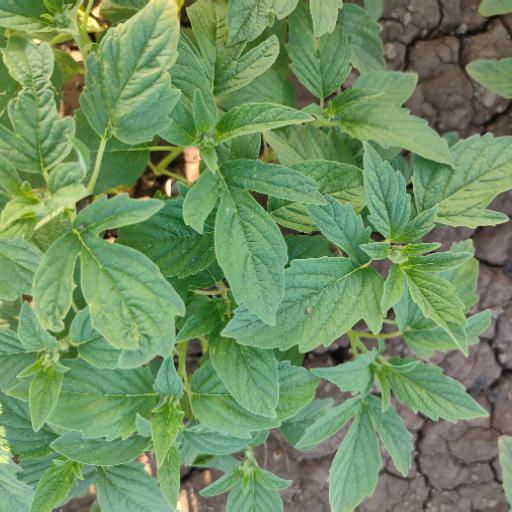

agri_0_9226.jpeg


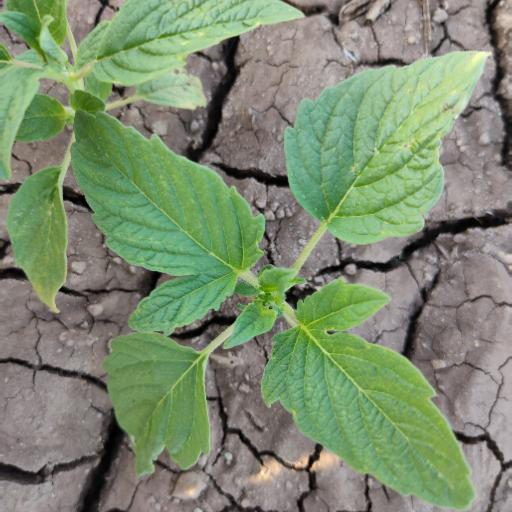

In [ ]:
for name in val_weeds[:10]:
  print(name)
  view_image_and_label(f'{root_directory}/val/weeds', name, show_label = False)

In [ ]:
REGEX = r'(test|train|validation|challenge2018)/([a-fA-F0-9]*)'

def check_and_homogenize_one_image(image):
  split, image_id = re.match(REGEX, image).groups()
  yield split, image_id


# New Section

In [ ]:
def check_and_homogenize_image_list(image_list):
  for line_number, image in enumerate(image_list):
    try:
      yield from check_and_homogenize_one_image(image)
    except (ValueError, AttributeError):
      raise ValueError(
          f'ERROR in line {line_number} of the image list. The following image '
          f'string is not recognized: "{image}".')

In [ ]:
def read_image_list_file(image_list_file):
  with open(image_list_file, 'r') as f:
    for line in f:
      yield line.strip().replace('.jpg', '')

In [ ]:
def download_one_image(bucket, split, image_id, download_folder):
  try:
    bucket.download_file(f'{split}/{image_id}.jpg',
                         os.path.join(download_folder, f'{image_id}.jpg'))
  except botocore.exceptions.ClientError as exception:
    sys.exit(
        f'ERROR when downloading image `{split}/{image_id}`: {str(exception)}')

In [ ]:
def download_all_images(args):
  """Downloads all images specified in the input file."""
  bucket = boto3.resource(
      's3', config=botocore.config.Config(
          signature_version=botocore.UNSIGNED)).Bucket(BUCKET_NAME)

  download_folder = args['download_folder'] or os.getcwd()

  if not os.path.exists(download_folder):
    os.makedirs(download_folder)

  try:
    image_list = list(
        check_and_homogenize_image_list(
            read_image_list_file(args['image_list'])))
  except ValueError as exception:
    sys.exit(exception)

  progress_bar = tqdm.tqdm(
      total=len(image_list), desc='Downloading images', leave=True)
  with futures.ThreadPoolExecutor(
      max_workers=args['num_processes']) as executor:
    all_futures = [
        executor.submit(download_one_image, bucket, split, image_id,
                        download_folder) for (split, image_id) in image_list
    ]
    for future in futures.as_completed(all_futures):
      future.result()
      progress_bar.update(1)
  progress_bar.close()

In [ ]:
if __name__ == '__main__':
  parser = argparse.ArgumentParser(
      description=__doc__, formatter_class=argparse.RawDescriptionHelpFormatter)
  parser.add_argument(
      'image_list',
      type=str,
      default=None,
      help=('Filename that contains the split + image IDs of the images to '
            'download. Check the document'))
  parser.add_argument(
      '--num_processes',
      type=int,
      default=5,
      help='Number of parallel processes to use (default is 5).')
  parser.add_argument(
      '--download_folder',
      type=str,
      default=None,
      help='Folder where to download the images.')
  download_all_images(vars(parser.parse_args()))